## Path configuration

In [1]:
from pathlib import Path
import os

PROJECT_NAME = "MALDIAlign"

cwd = Path().resolve()

# Walk upwards until we find the project folder
target = None
for parent in [cwd] + list(cwd.parents):
    if parent.name == PROJECT_NAME:
        target = parent
        break

# If the project folder is found and we are not already there, then change cwd
if target is not None and target != cwd:
    os.chdir(target)

print("Working directory:", os.getcwd())

Working directory: /export/usuarios01/agnavarr/MALDIAlign


## Imports

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from utils.config import load_config
from utils.data import load_pkl

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, trustworthiness
from sklearn.utils import resample

## Data loading

In [26]:
cfg = load_config()
driams_pkl = cfg["data"]["DRIAMS_REDUCED_PKL"]
marisma_pkl = cfg["data"]["MARISMa_REDUCED_PKL"]
msumg_pkl = cfg["data"]["MSUMG_PKL"]
rki_pkl = cfg["data"]["RKI_PKL"]

In [27]:
driams = load_pkl(driams_pkl)
marisma = load_pkl(marisma_pkl)
msumg = load_pkl(msumg_pkl)
rki = load_pkl(rki_pkl)

In [28]:
data_driams, label_driams, meta_driams = driams["data"], driams["label"], pd.DataFrame.from_records(list(driams["meta"]))
data_marisma, label_marisma, meta_marisma = marisma["data"], marisma["label"], pd.DataFrame.from_records(list(marisma["meta"]))
data_msumg, label_msumg, meta_msumg = msumg["data"], msumg["label"], pd.DataFrame.from_records(list(msumg["meta"]))
data_rki, label_rki, meta_rki = rki["data"], rki["label"], pd.DataFrame.from_records(list(rki["meta"]))

In [29]:
meta_marisma.insert(
    loc=0,
    column="hospital",
    value="MARISMA"
)

meta_msumg.insert(
    loc=0,
    column="hospital",
    value="MS-UMG"
)

meta_rki.insert(
    loc=0,
    column="hospital",
    value="RKI"
)

In [30]:
data_all = np.vstack([data_driams, data_marisma, data_msumg, data_rki])
label_all= np.concatenate([label_driams, label_marisma, label_msumg, label_rki])
meta_all = pd.concat([meta_driams, meta_marisma, meta_msumg, meta_rki], ignore_index=True)

In [31]:
# axis=1 to work row by row
# keepdims=True keeps the dimensions needed for per-row normalization to work correctly
data_norm = (data_all - data_all.min(axis=1, keepdims=True)) / (
    data_all.max(axis=1, keepdims=True) - data_all.min(axis=1, keepdims=True) + 1e-8)

## PCA

Reduce dimensionality (there are 6000 features)

In [32]:
my_pca = PCA().fit(data_norm)

In [33]:
# explained_variance_ returns the amount of variance explained by each of the selected components
# explained_variance_ratio_ returns the percentage of variance explained by each of the selected components
cumulative_explained_var = np.cumsum(my_pca.explained_variance_)
cumulative_explained_var_ratio = np.cumsum(my_pca.explained_variance_ratio_)

Text(0, 0.5, 'Cumulative explained variance')

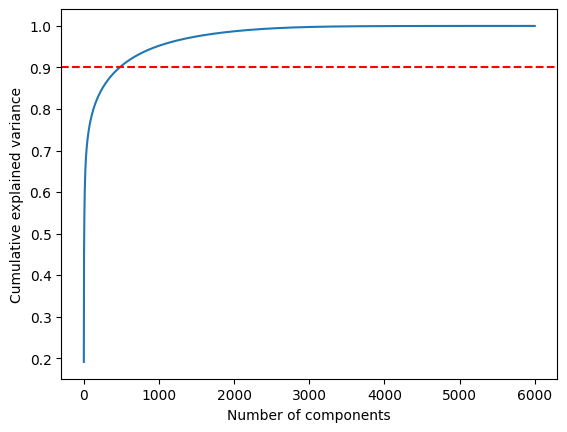

In [34]:
plt.plot(np.arange(1, len(cumulative_explained_var_ratio)+1), cumulative_explained_var_ratio)
plt.axhline(0.9, color='r', linestyle='--')
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")

In [35]:
n_components = np.argmax(cumulative_explained_var_ratio >= 0.9) + 1
print(f"Number of components explaining 90% variance: {n_components}")

Number of components explaining 90% variance: 478


This indicates that 124 components are needed to account for 90% of the variance in our dataset

In [36]:
data_norm_pca = PCA(n_components=n_components).fit_transform(data_norm)

## t-SNE

In [37]:
my_tsne = TSNE(n_components=2)
data_tsne = my_tsne.fit_transform(data_norm_pca)

## Visualization

In [38]:
# Create a DataFrame combining coordinates and metadata
tsne_df = pd.DataFrame({
    "x": data_tsne[:, 0],
    "y": data_tsne[:, 1],
    "species": label_all,
    "year": meta_all["year"].astype(str), 
    "hospital": meta_all["hospital"].astype(str)
})
tsne_df

,x,y,species,year,hospital
0,19.646564,-68.914680,Klebsiella_Pneumoniae,2018,DRIAMS_B
1,22.170275,-65.878571,Klebsiella_Pneumoniae,2018,DRIAMS_B
2,20.611847,-66.609673,Klebsiella_Pneumoniae,2018,DRIAMS_B
3,22.673933,-66.506966,Klebsiella_Pneumoniae,2018,DRIAMS_B
4,28.459904,-76.181618,Klebsiella_Pneumoniae,2018,DRIAMS_B
...,...,...,...,...,...
149424,-8.435373,109.958641,Pseudomonas_Aeruginosa,nan,RKI
149425,-8.516634,109.902657,Pseudomonas_Aeruginosa,nan,RKI
149426,-29.570240,87.796883,Pseudomonas_Aeruginosa,nan,RKI
149427,-27.897884,88.257858,Pseudomonas_Aeruginosa,nan,RKI


### Global t-SNE

In [39]:
from utils.viz import *

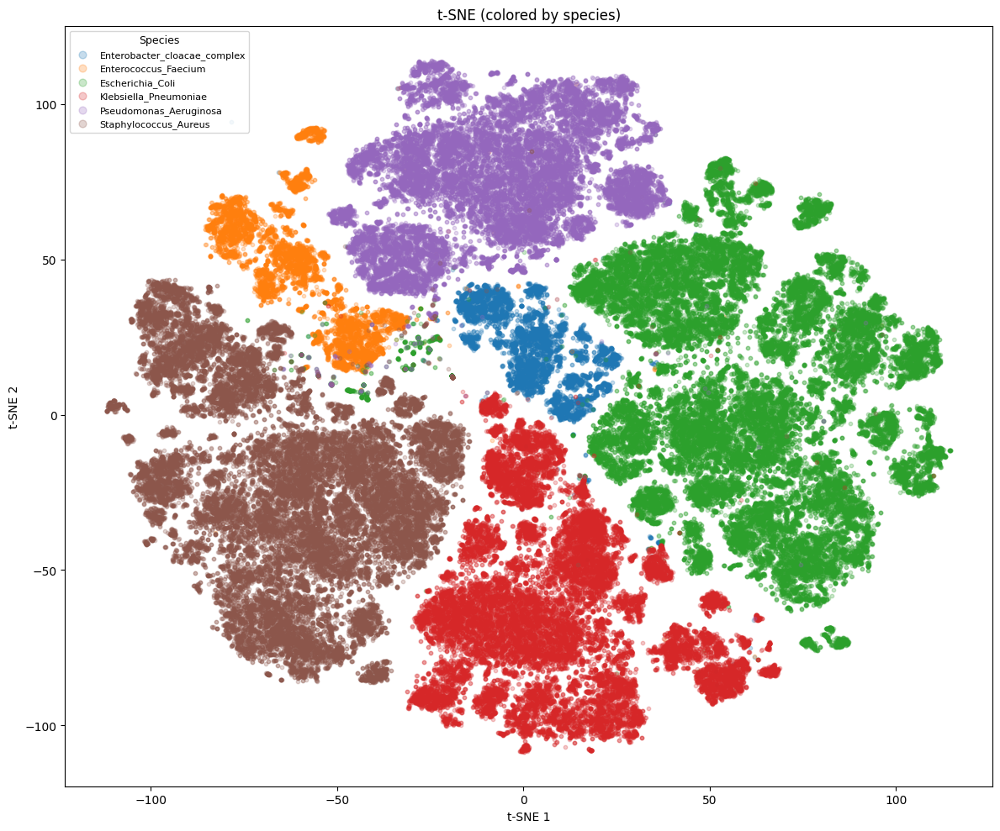

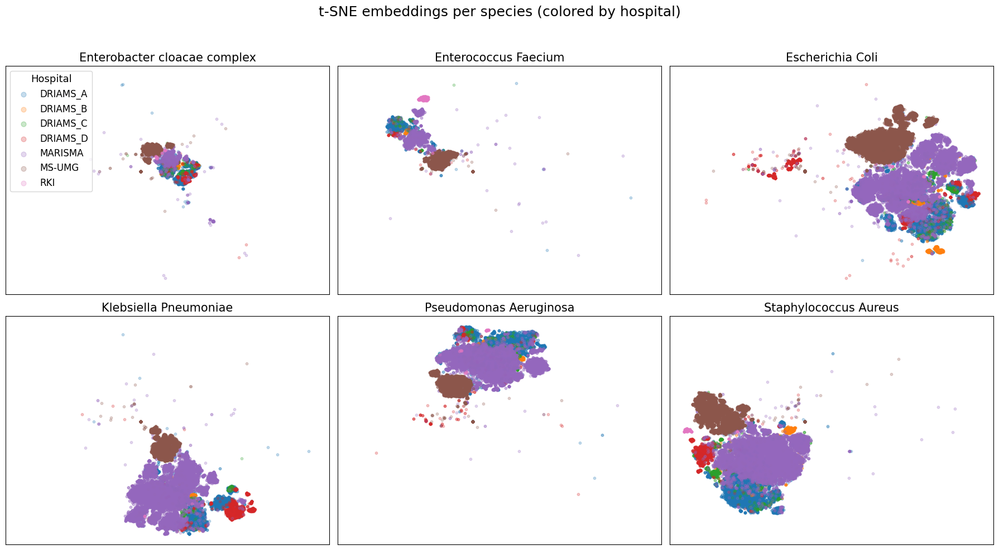

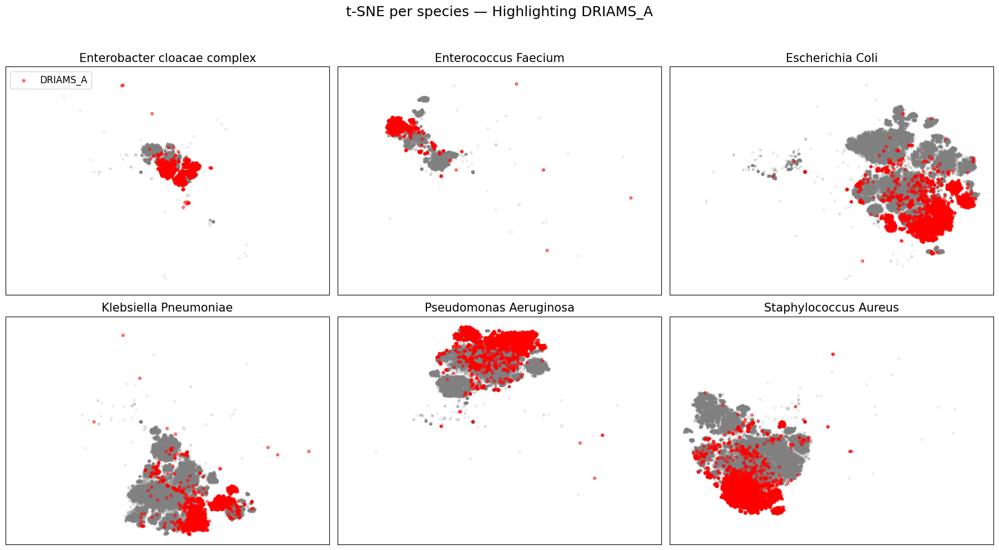

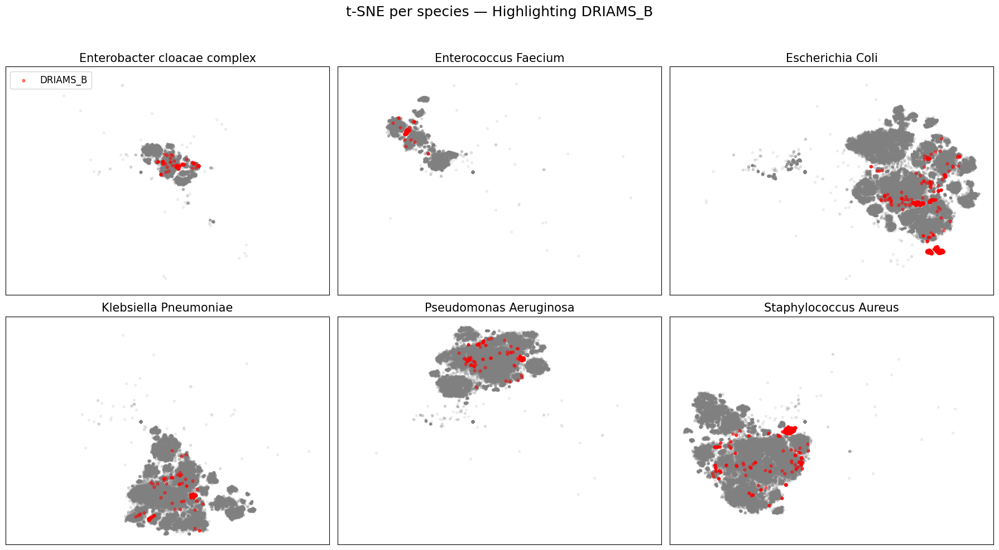

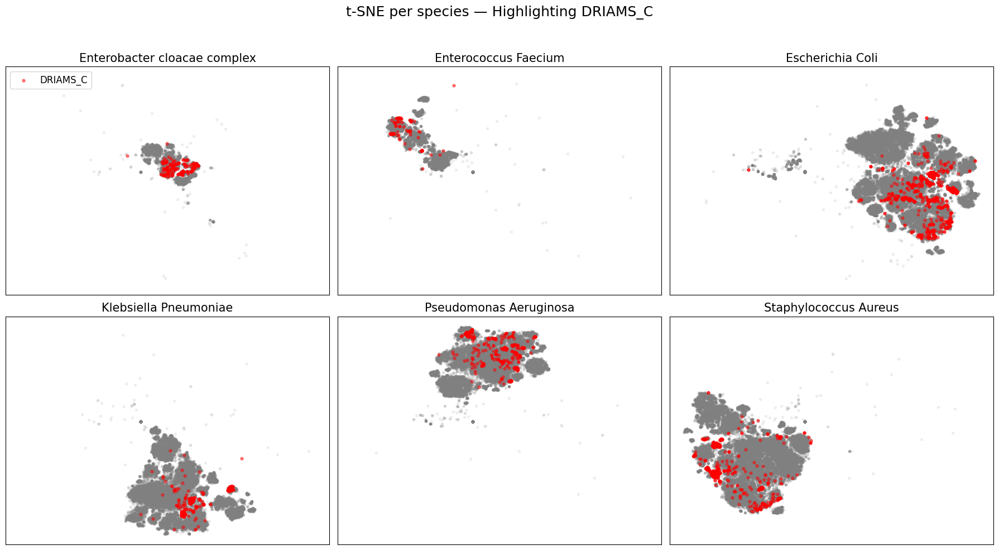

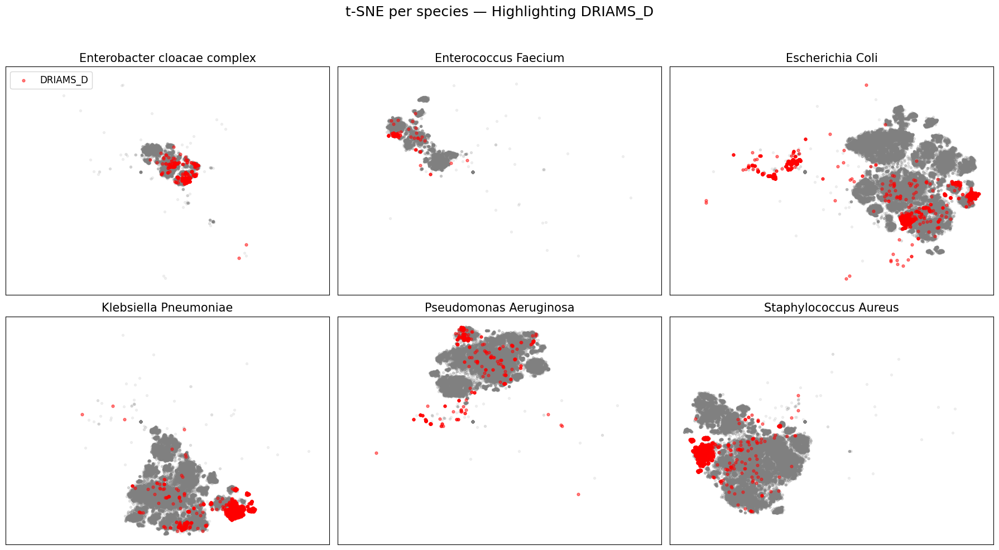

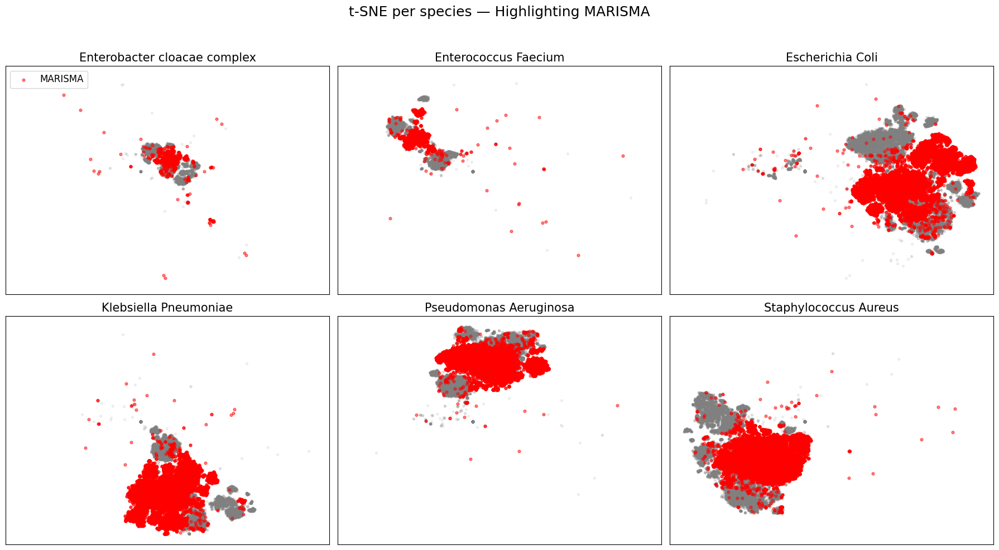

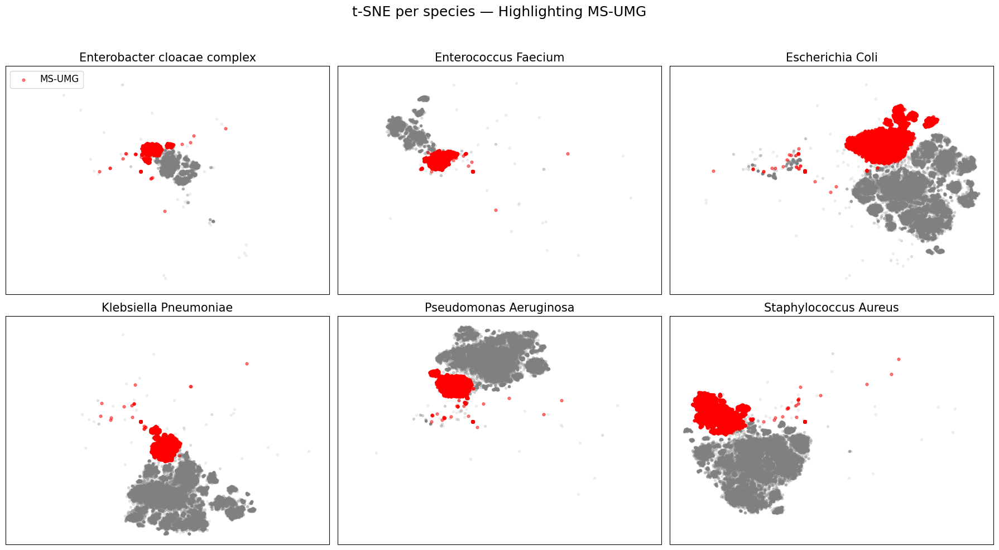

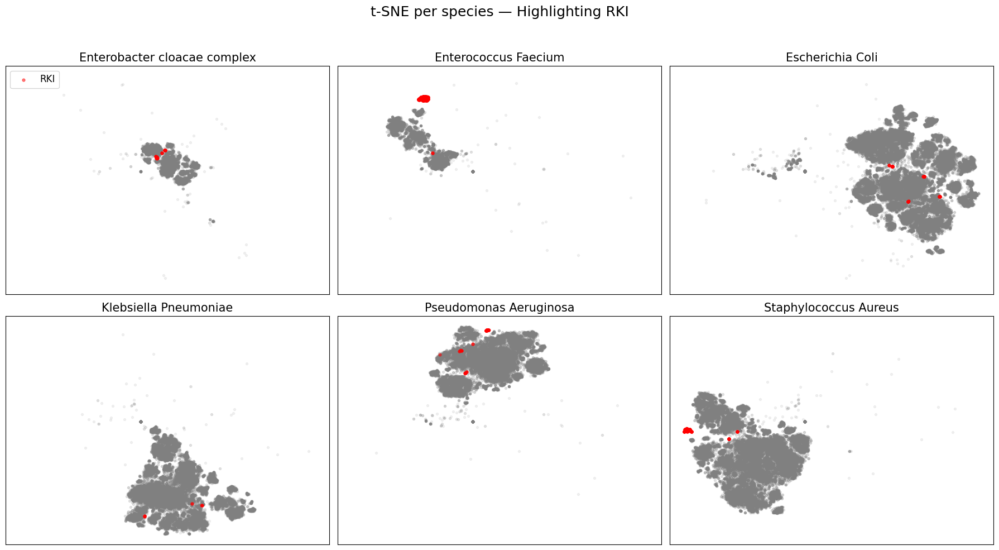

In [40]:
# 1) Global
plot_tsne_global(tsne_df)

# 2) Intra-especie
plot_tsne_global(tsne_df, per_species=True)

# 3) Overlay hospital
plot_tsne_global(tsne_df, per_species=True, overlay_per_hospital=True)

### t-SNE per Species

In [41]:
df_all, tsne_results = compute_tsne_per_species(
    X=data_norm_pca,
    labels=label_all,
    metadata=meta_all
)

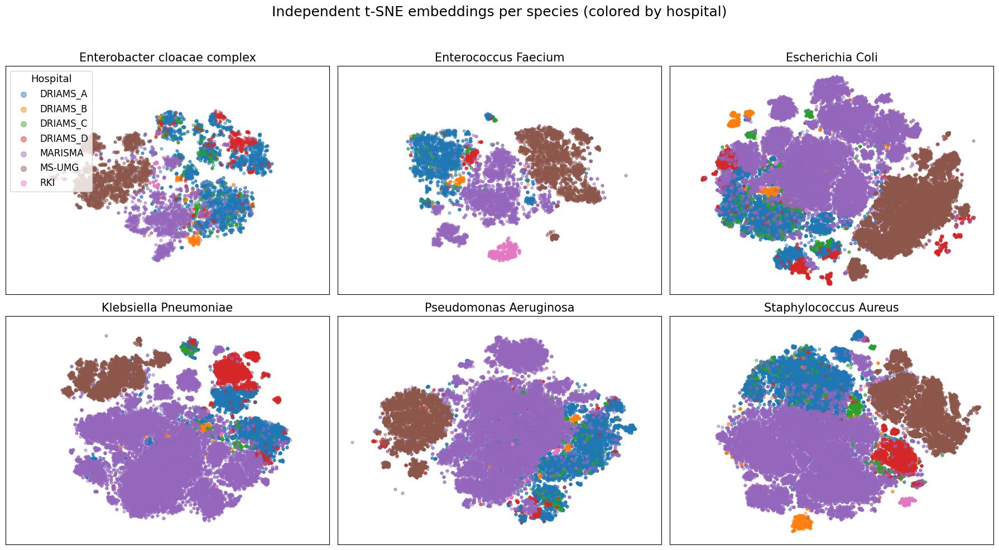

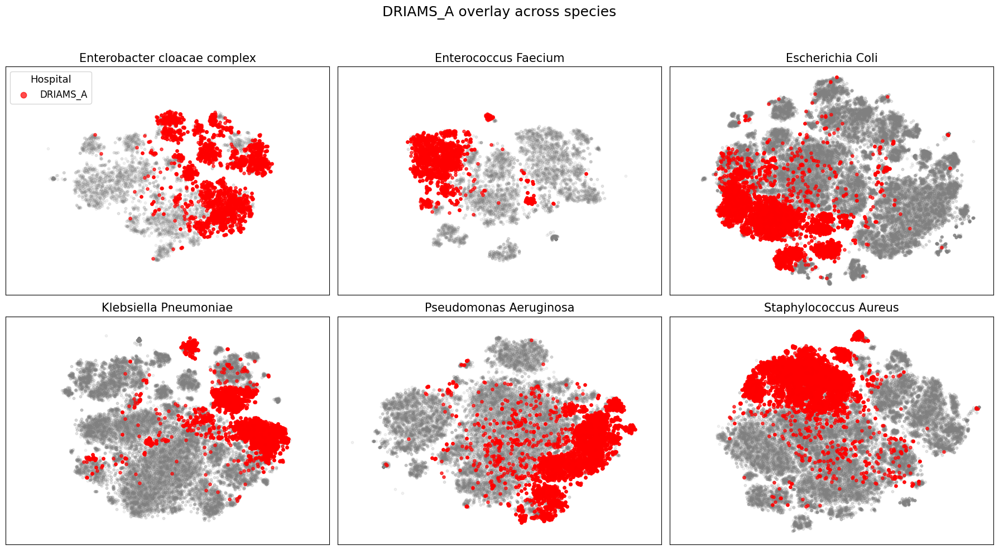

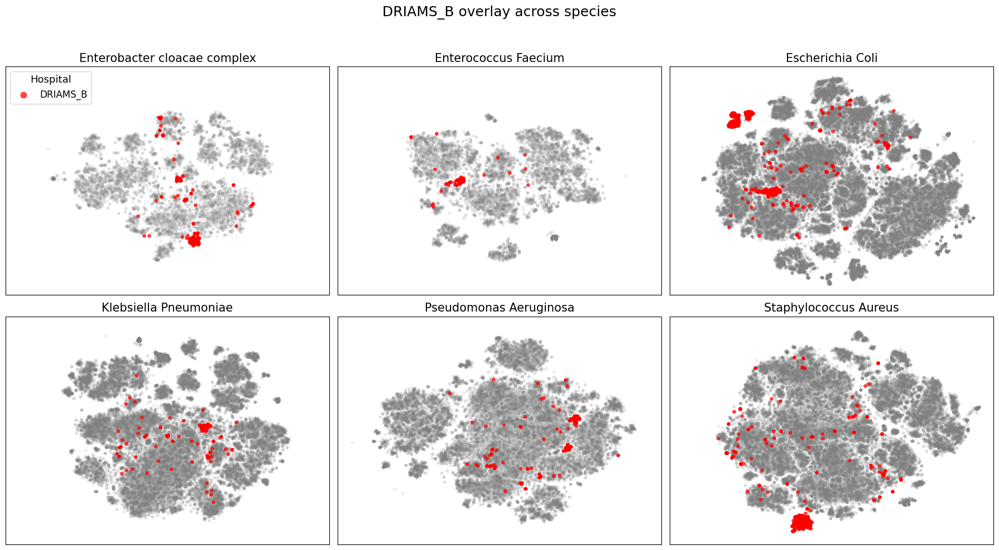

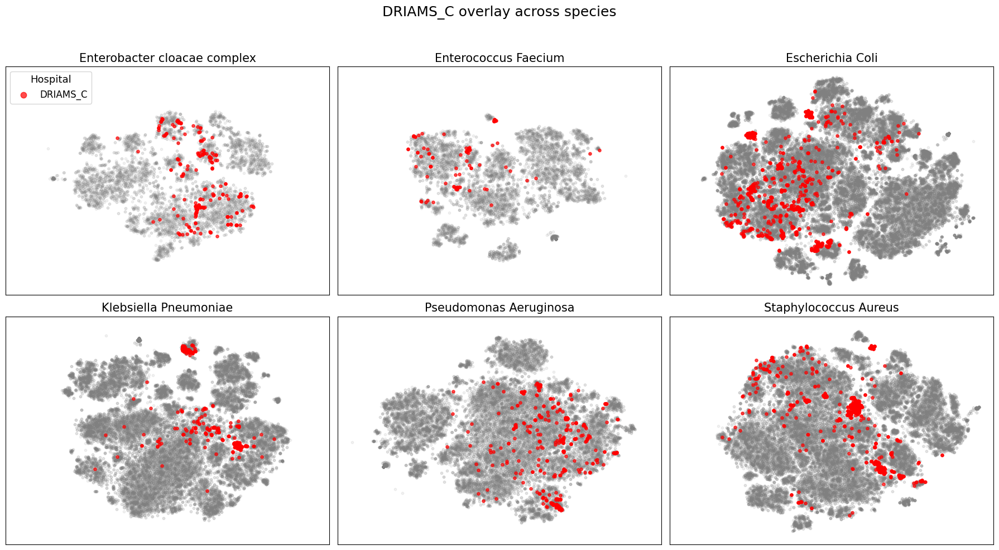

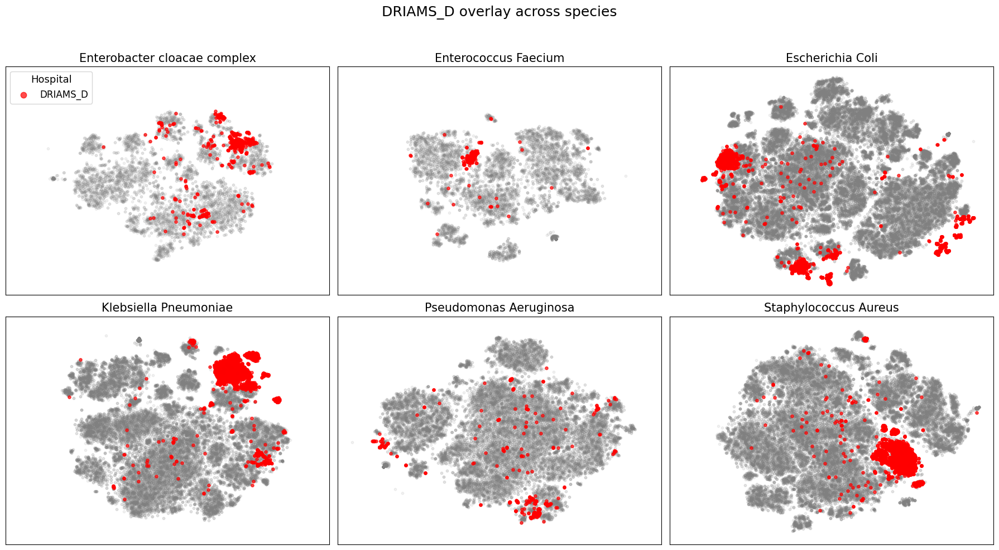

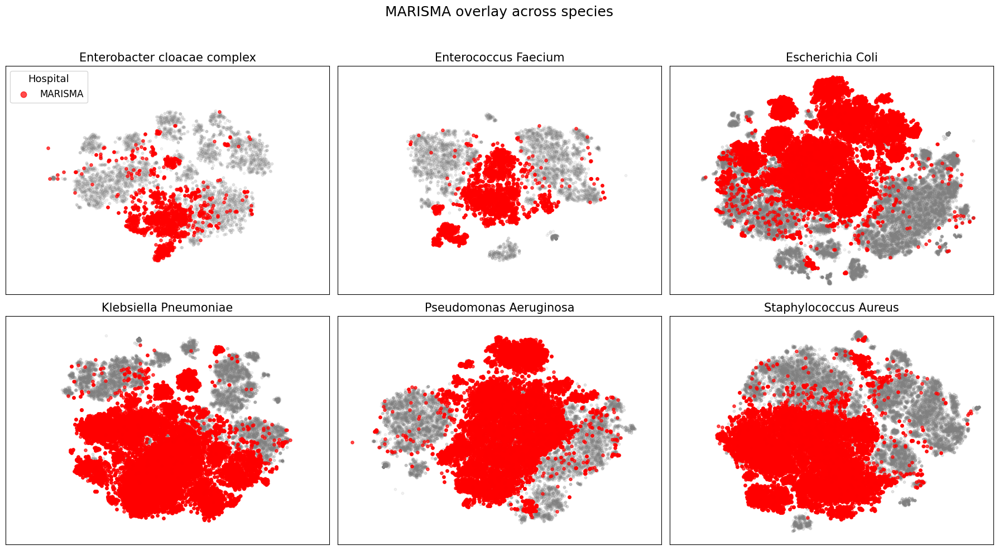

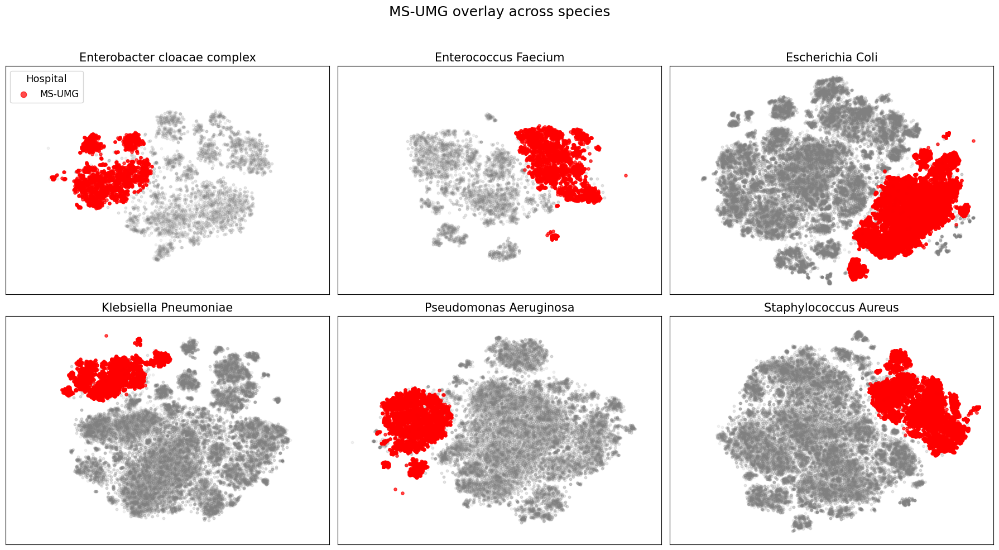

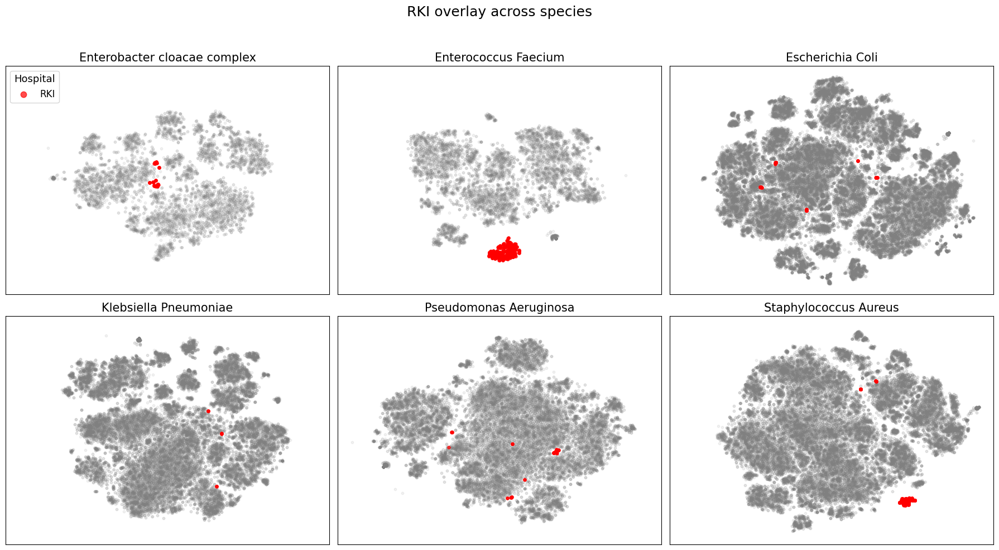

In [42]:
plot_tsne_species(
    df_all,
    tsne_results,
    overlay_per_hospital=False
)

plot_tsne_species(
    df_all,
    tsne_results,
    overlay_per_hospital=True
)